<b> Install Prophet </b>
https://facebook.github.io/prophet/docs/installation.html

<b> Reference </b> 
https://facebook.github.io/prophet/docs/quick_start.html#python-api

In [2]:
import numpy as np
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

<b> Data </b>

The input to Prophet is always a dataframe with two columns: `ds` and `y`. The `ds` (datestamp) column should be of a format expected by Pandas, ideally YYYY-MM-DD for a date or YYYY-MM-DD HH:MM:SS for a timestamp. The `y` column must be numeric, and represents the measurement we wish to forecast.

As an example, let’s look at a time series of the log daily page views for the Wikipedia page for Peyton Manning. 

In [3]:
df = pd.read_csv('example_wp_log_peyton_manning.csv')
df.head()

,ds,y
0,2007-12-10,9.590761
1,2007-12-11,8.519590
2,2007-12-12,8.183677
3,2007-12-13,8.072467
4,2007-12-14,7.893572


In [4]:
df['ds'] = pd.to_datetime(df['ds'])

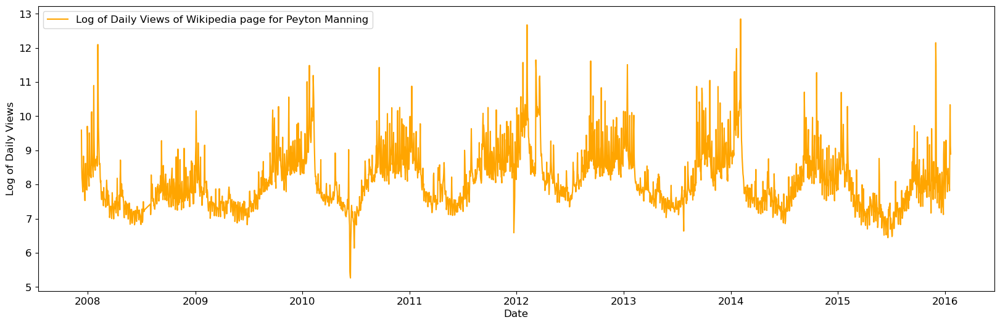

In [5]:
#see the TS plot

plt.rc('font', size=12)
fig, ax = plt.subplots(figsize=(20, 6))

ax.plot(df.ds, df.y, color='orange', label='Log of Daily Views of Wikipedia page for Peyton Manning')
ax.set_xlabel('Date')
ax.set_ylabel('Log of Daily Views')
ax.legend(loc='upper left')

<b> I. Forecasting </b>

The basic model fitting and forecasting can be done by 

- creating a new Prophet project
- call `fit` to fit on the given historic data
- predictions are then made on a dataframe with a column ds containing the dates for which a prediction is to be made.

By default, Prophet uses the piecewise linear model for its forecast

In [6]:
#Prophet project
m = Prophet()

#Fit with default settings
m.fit(df)
#Fataframe with forecasting steps
future = m.make_future_dataframe(periods=365)
#Forecast
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

14:27:16 - cmdstanpy - INFO - Chain [1] start processing
14:27:17 - cmdstanpy - INFO - Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
3265,2017-01-15,8.213906,7.500214,8.943348
3266,2017-01-16,8.538940,7.727008,9.315603
3267,2017-01-17,8.326370,7.625714,9.096192
3268,2017-01-18,8.159030,7.451144,8.825964
3269,2017-01-19,8.170992,7.430248,8.892563


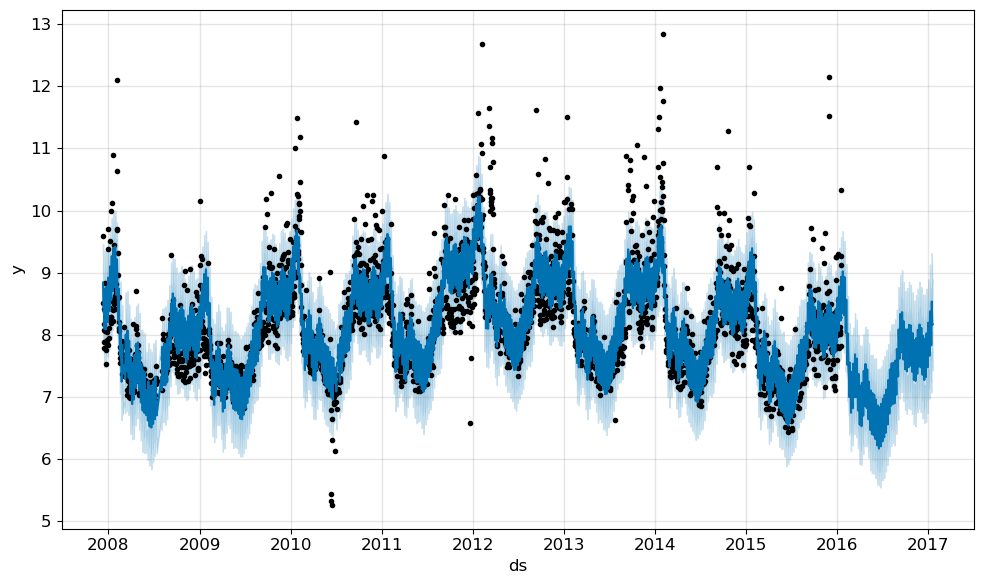

In [7]:
fig1 = m.plot(forecast)

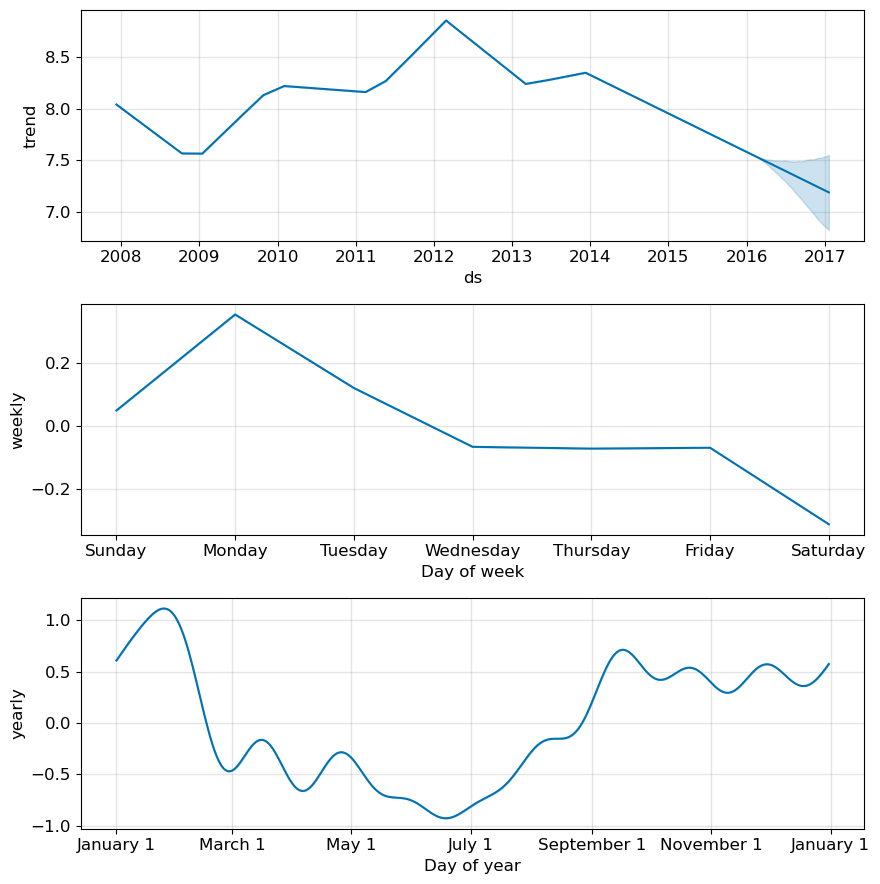

In [8]:
fig2 = m.plot_components(forecast)

An interactive figure of the forecast and components can be created with `plotly`.

In [9]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [10]:
plot_components_plotly(m, forecast)

We have talked about this in class, that a nonlinear saturating growth is more common for business data. This can be done by adding a `cap` that can be decided by expertise. 

In [11]:
df['cap'] = 8.5


Note: cap must be specified for every row in the dataframe, and that it does not have to be constant. If the market size is growing, then cap can be an increasing sequence.

14:27:43 - cmdstanpy - INFO - Chain [1] start processing
14:27:43 - cmdstanpy - INFO - Chain [1] done processing


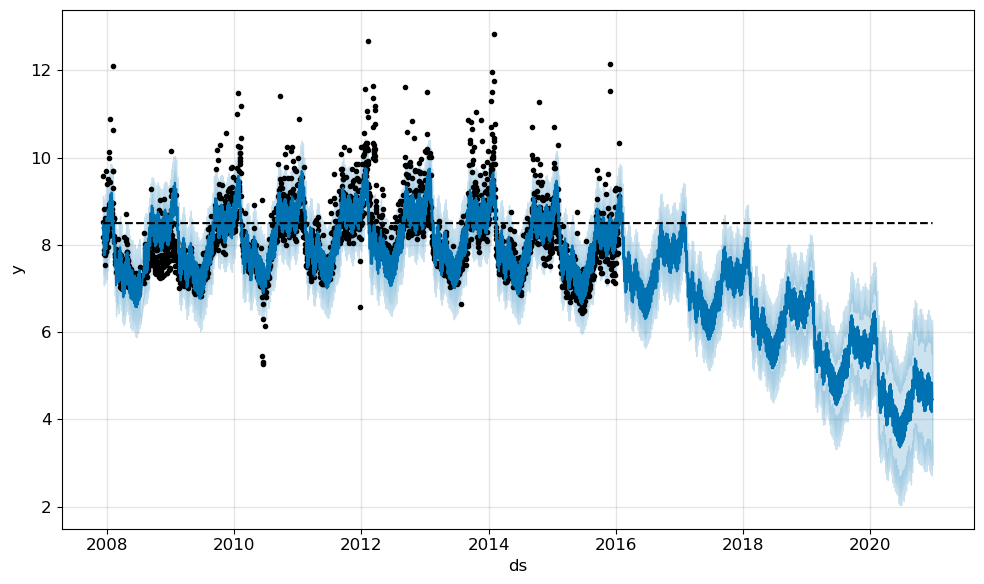

In [12]:
m = Prophet(growth='logistic')
m.fit(df)
future = m.make_future_dataframe(periods=1800)
future['cap'] = 8.5
fcst = m.predict(future)
fig = m.plot(fcst)

<b> II. Trend Changepoints</b>

- <b>Automatic changepoints detection</b>: give a large posible number of changepoints, and a prior distribution of change rates. The default is Laplace, which is equivalent to a L1 regularization.
- By default changepoints are only inferred for the first 80% of the time series in order to have plenty of runway for projecting the trend forward and to avoid overfitting. 

14:27:53 - cmdstanpy - INFO - Chain [1] start processing
14:27:53 - cmdstanpy - INFO - Chain [1] done processing


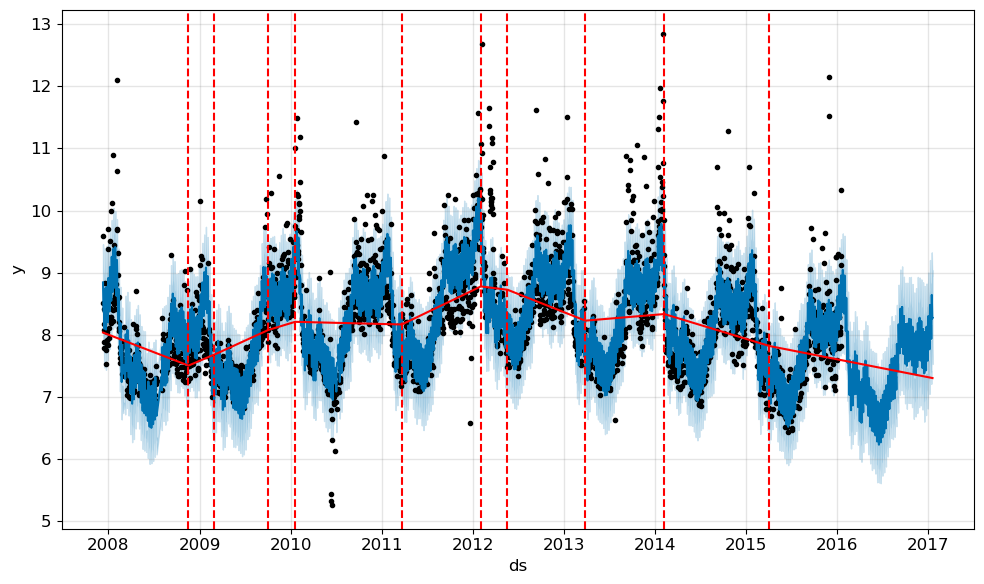

In [13]:
from prophet.plot import add_changepoints_to_plot
m = Prophet(changepoint_range=0.9)
m.fit(df)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

In [14]:
plot_components_plotly(m, forecast)

If the trend changes are being overfit (too much flexibility) or underfit (not enough flexibility), you can adjust the strength of the sparse prior using the input argument `changepoint_prior_scale`. By default, this parameter is set to 0.05. Increasing it will make the trend more flexible which reflects in <b> uncertainty interval</b>. 

14:28:04 - cmdstanpy - INFO - Chain [1] start processing
14:28:04 - cmdstanpy - INFO - Chain [1] done processing


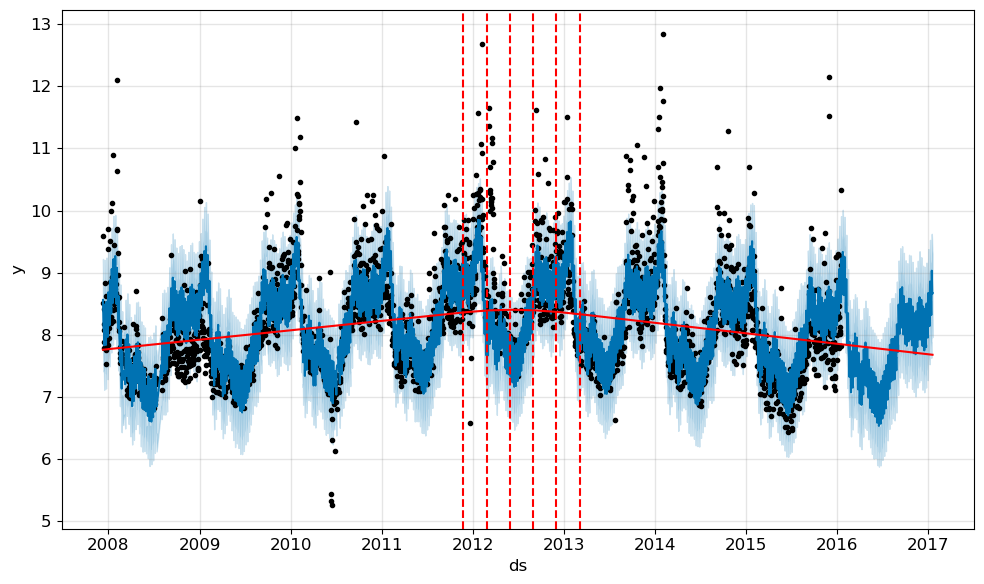

In [15]:
m = Prophet(changepoint_prior_scale=0.001) #change to 0.5
forecast = m.fit(df).predict(future)
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

If you wish, rather than using automatic changepoint detection you can manually specify the locations of potential changepoints with the changepoints argument.

14:28:08 - cmdstanpy - INFO - Chain [1] start processing
14:28:08 - cmdstanpy - INFO - Chain [1] done processing


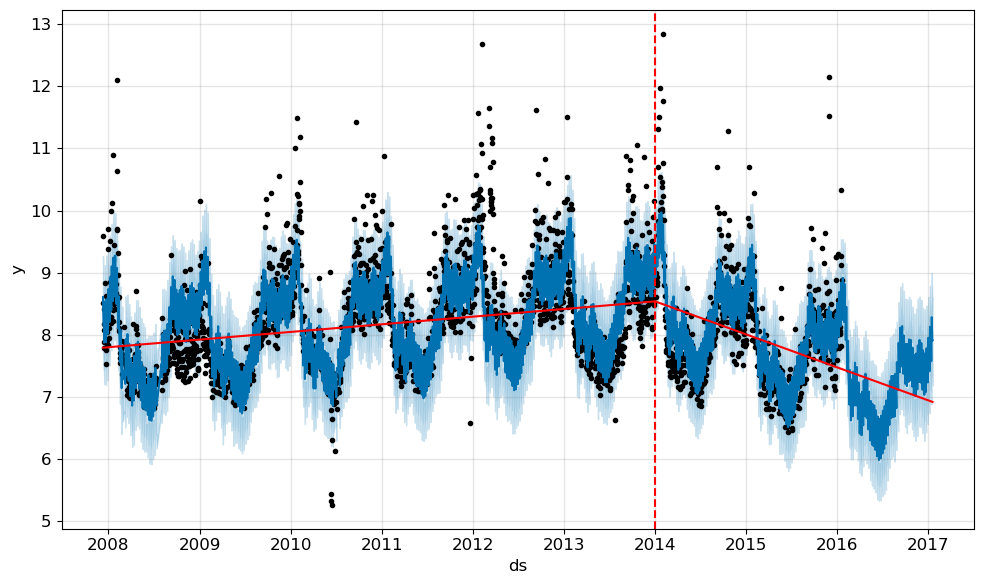

In [16]:
m = Prophet(changepoints=['2014-01-01'])
forecast = m.fit(df).predict(future)
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

In [17]:
plot_components_plotly(m, forecast)

<b>III. Model seasonality </b>

- By default, it gives weekly and yearly seasonality.
- It will also fit daily seasonality for a sub-daily time series.
- You can add other seasonalities (monthly, quarterly, hourly) using the `add_seasonality` method.

14:28:18 - cmdstanpy - INFO - Chain [1] start processing
14:28:19 - cmdstanpy - INFO - Chain [1] done processing


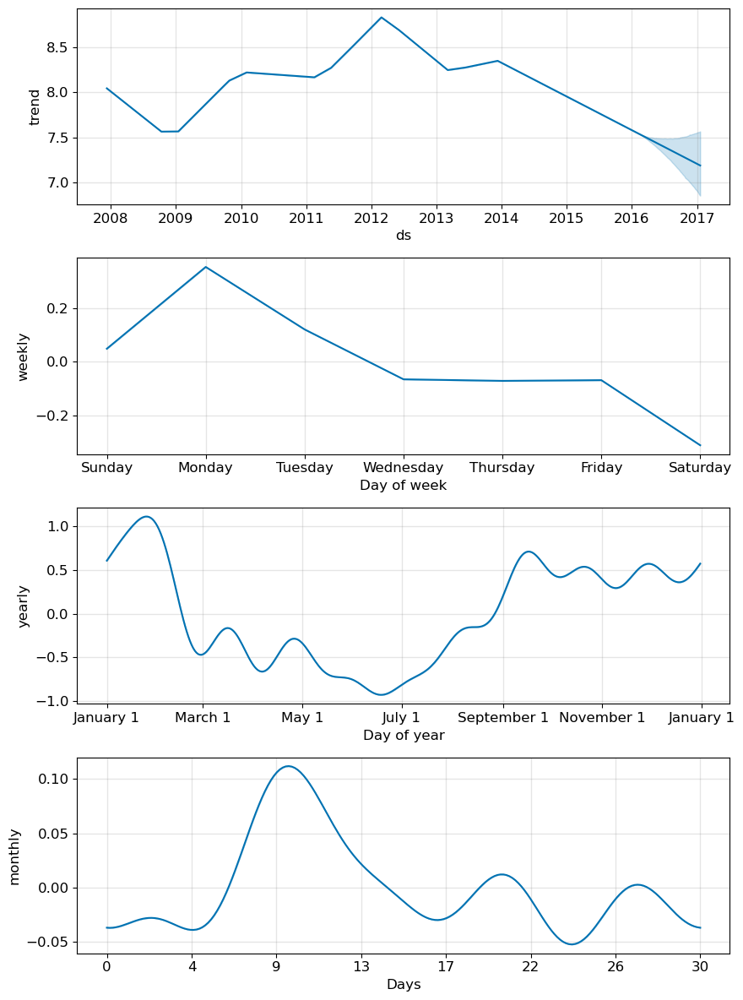

In [18]:
#m = Prophet(weekly_seasonality=False)
m = Prophet()
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
forecast = m.fit(df).predict(future)
fig = m.plot_components(forecast)

Note: Fourier series use `orders` to estimate the weekly (default=3), monthly (default=5) and yearly (default=10) to estimate the seasonalities. They usually work pretty well. 

<b>IV. Modeling holidays </b>

- you must create a dataframe for them. It has two columns (holiday and ds) and a row for each occurrence of the holiday.
- you need to include holidays both in the past and in the future. 
- If they won’t repeat in the future, Prophet will model them and then not include them in the forecast.

In [19]:
#Here we create a dataframe that includes the dates of all of Peyton Manning’s playoff appearances:

playoffs = pd.DataFrame({
  'holiday': 'playoff',
  'ds': pd.to_datetime(['2008-01-13', '2009-01-03', '2010-01-16',
                        '2010-01-24', '2010-02-07', '2011-01-08',
                        '2013-01-12', '2014-01-12', '2014-01-19',
                        '2014-02-02', '2015-01-11', '2016-01-17',
                        '2016-01-24', '2016-02-07']),
  'lower_window': 0,
  'upper_window': 1,
})
superbowls = pd.DataFrame({
  'holiday': 'superbowl',
  'ds': pd.to_datetime(['2010-02-07', '2014-02-02', '2016-02-07']),
  'lower_window': 0,
  'upper_window': 1,
})
holidays = pd.concat((playoffs, superbowls))

In [20]:
m = Prophet(holidays=holidays)
forecast = m.fit(df).predict(future)


14:28:29 - cmdstanpy - INFO - Chain [1] start processing
14:28:29 - cmdstanpy - INFO - Chain [1] done processing


The holiday effect can be seen in the forecast dataframe:

In [21]:
forecast[(forecast['playoff'] + forecast['superbowl']).abs() > 0][
        ['ds', 'playoff', 'superbowl']][-10:]

,ds,playoff,superbowl
2190,2014-02-02,1.212585,1.221407
2191,2014-02-03,1.899687,1.459211
2532,2015-01-11,1.212585,0.000000
2533,2015-01-12,1.899687,0.000000
2901,2016-01-17,1.212585,0.000000
2902,2016-01-18,1.899687,0.000000
2908,2016-01-24,1.212585,0.000000
2909,2016-01-25,1.899687,0.000000
2922,2016-02-07,1.212585,1.221407
2923,2016-02-08,1.899687,1.459211


The holiday effects will also show up in the components plot, where we see that there is a spike on the days around playoff appearances, with an especially large spike for the superbowl:

In [22]:
plot_components_plotly(m, forecast)


You can also use a built-in collection of country-specific holidays using the `add_country_holidays method`.

In [23]:
m = Prophet(holidays=holidays)
m.add_country_holidays(country_name='US')
m.fit(df)

14:28:41 - cmdstanpy - INFO - Chain [1] start processing
14:28:41 - cmdstanpy - INFO - Chain [1] done processing


In [24]:
m.train_holiday_names


0                         playoff
1                       superbowl
2      Martin Luther King Jr. Day
3           Washington's Birthday
4                    Columbus Day
5                  New Year's Day
6                    Memorial Day
7                Independence Day
8                       Labor Day
9                    Veterans Day
10                   Thanksgiving
11                  Christmas Day
12       Christmas Day (Observed)
13        Veterans Day (Observed)
14    Independence Day (Observed)
15      New Year's Day (Observed)
dtype: object

In [25]:
plot_components_plotly(m, forecast)


If you find that the holidays are overfitting, you can adjust their prior scale to smooth them using the parameter `holidays_prior_scale`. By default this parameter is 10, which provides very little regularization. Reducing this parameter dampens holiday effects:

In [26]:
m = Prophet(holidays=holidays, holidays_prior_scale=10).fit(df) #try 0.05
forecast = m.predict(future)
forecast[(forecast['playoff'] + forecast['superbowl']).abs() > 0][
    ['ds', 'playoff', 'superbowl']][-10:]

14:28:50 - cmdstanpy - INFO - Chain [1] start processing
14:28:51 - cmdstanpy - INFO - Chain [1] done processing


,ds,playoff,superbowl
2190,2014-02-02,1.212585,1.221407
2191,2014-02-03,1.899687,1.459211
2532,2015-01-11,1.212585,0.000000
2533,2015-01-12,1.899687,0.000000
2901,2016-01-17,1.212585,0.000000
2902,2016-01-18,1.899687,0.000000
2908,2016-01-24,1.212585,0.000000
2909,2016-01-25,1.899687,0.000000
2922,2016-02-07,1.212585,1.221407
2923,2016-02-08,1.899687,1.459211


<b> V. Outliers </b> 

Let's add a chunk of "bad data" to the orginal data and see how it affects the forecasting.

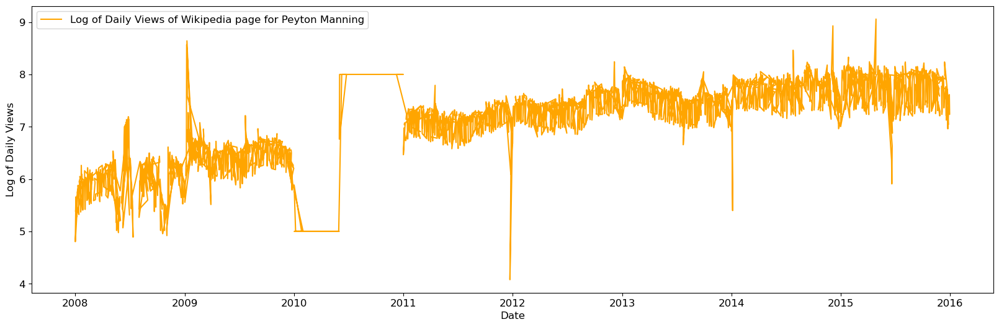

In [27]:
df_outliers = pd.read_csv('example_wp_log_R_outliers1.csv')
df_outliers['ds'] = pd.to_datetime(df_outliers['ds'])


plt.rc('font', size=12)
fig, ax = plt.subplots(figsize=(20, 6))

ax.plot(df_outliers.ds, df_outliers.y, color='orange', label='Log of Daily Views of Wikipedia page for Peyton Manning')
ax.set_xlabel('Date')
ax.set_ylabel('Log of Daily Views')
ax.legend(loc='upper left');

14:29:30 - cmdstanpy - INFO - Chain [1] start processing
14:29:30 - cmdstanpy - INFO - Chain [1] done processing


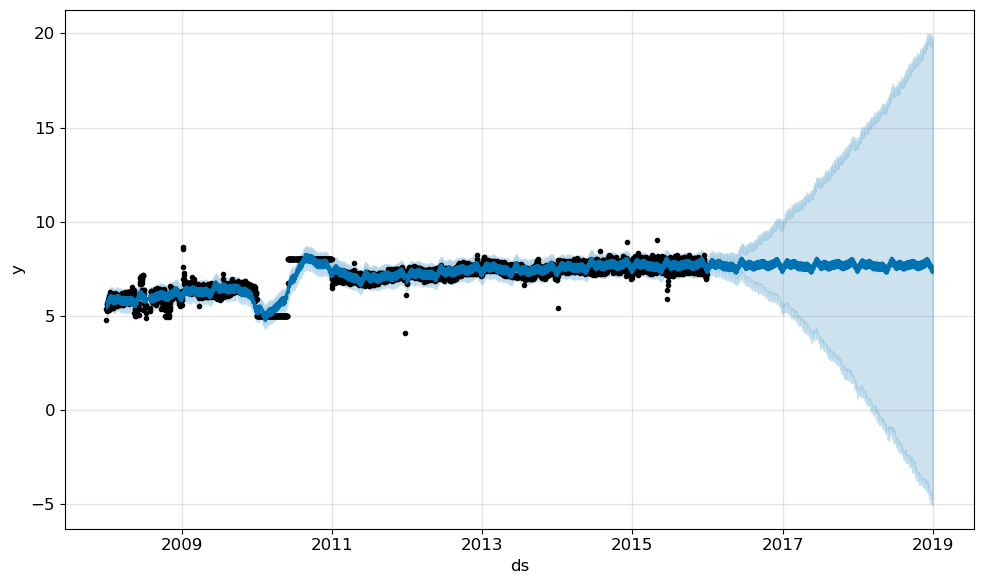

In [28]:

m = Prophet()
m.fit(df_outliers)
future = m.make_future_dataframe(periods=1096)
forecast = m.predict(future)
fig = m.plot(forecast)


- The trend forecast seems reasonable
- But uncertainty intervals seem way too wide. 
- Prophet is able to handle the outliers in the history, but only by fitting them with trend changes.

The best way to handle outliers is to replace them with NA. Then Prophet auto-fill the NA then predict the future. 

14:29:37 - cmdstanpy - INFO - Chain [1] start processing
14:29:38 - cmdstanpy - INFO - Chain [1] done processing


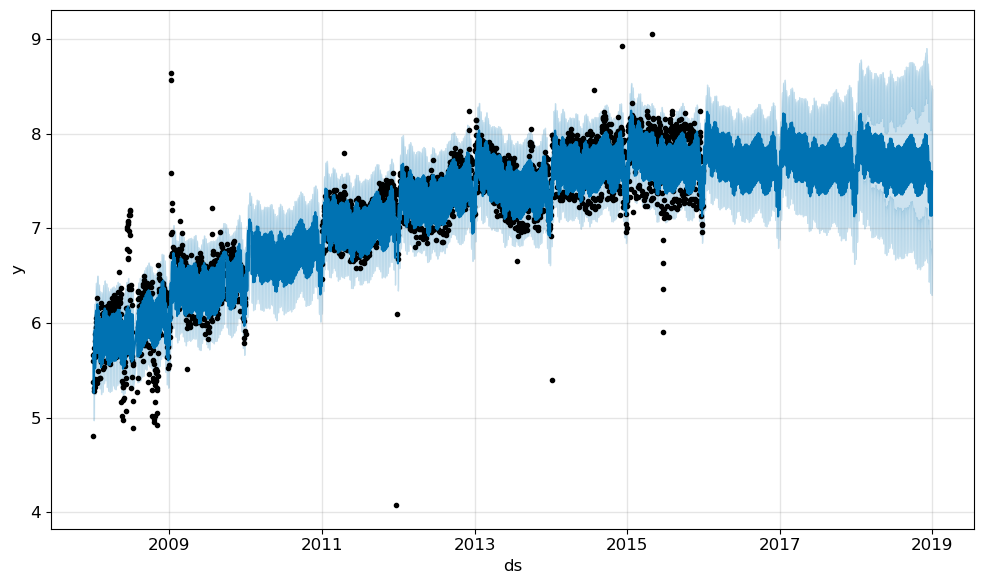

In [29]:
#just an example, outlier detection later
df_outliers.loc[(df_outliers['ds'] > '2010-01-01') & (df_outliers['ds'] < '2011-01-01'), 'y'] = None
model = Prophet().fit(df_outliers)
fig = model.plot(model.predict(future))

<b> VI. Cross Validation in Prophet </b>

Prophet includes functionality for time series cross validation to measure forecast error using historical data. You need choose:

- Initial train size
- Horizon: the period you want to forecast
- Period: the size of rolling window

For example, here we do cross-validation to assess prediction performance on a horizon of 365 days, starting with 730 days of initial training data in the first cutoff and then making prediction rolling window for every 180 days. On this 8 year time series, this corresponds to 11 total forecasts.

In [30]:
from prophet.diagnostics import cross_validation
df_cv = cross_validation(m, initial='730 days', period='180 days', horizon = '365 days')


  0%|          | 0/11 [00:00<?, ?it/s]

14:29:42 - cmdstanpy - INFO - Chain [1] start processing
14:29:42 - cmdstanpy - INFO - Chain [1] done processing
14:29:42 - cmdstanpy - INFO - Chain [1] start processing
14:29:42 - cmdstanpy - INFO - Chain [1] done processing
14:29:42 - cmdstanpy - INFO - Chain [1] start processing
14:29:43 - cmdstanpy - INFO - Chain [1] done processing
14:29:43 - cmdstanpy - INFO - Chain [1] start processing
14:29:43 - cmdstanpy - INFO - Chain [1] done processing
14:29:43 - cmdstanpy - INFO - Chain [1] start processing
14:29:43 - cmdstanpy - INFO - Chain [1] done processing
14:29:44 - cmdstanpy - INFO - Chain [1] start processing
14:29:44 - cmdstanpy - INFO - Chain [1] done processing
14:29:44 - cmdstanpy - INFO - Chain [1] start processing
14:29:44 - cmdstanpy - INFO - Chain [1] done processing
14:29:45 - cmdstanpy - INFO - Chain [1] start processing
14:29:45 - cmdstanpy - INFO - Chain [1] done processing
14:29:45 - cmdstanpy - INFO - Chain [1] start processing
14:29:46 - cmdstanpy - INFO - Chain [1]

In [31]:
#check performance 

from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv) #by default start with 10% of the horizon
df_p

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,37 days,0.136574,0.369559,0.306855,0.042941,0.035395,0.042756,0.764322
1,38 days,0.138452,0.372091,0.308262,0.043019,0.035635,0.042847,0.764733
2,39 days,0.140633,0.375010,0.309800,0.043120,0.036478,0.042939,0.764733
3,40 days,0.142454,0.377431,0.310842,0.043202,0.035395,0.043000,0.767474
4,41 days,0.143448,0.378745,0.311741,0.043330,0.035345,0.043109,0.766103
...,...,...,...,...,...,...,...,...
324,361 days,5.759554,2.399907,1.565146,0.217055,0.101139,0.214749,0.814299
325,362 days,5.763554,2.400740,1.565000,0.217328,0.101475,0.215085,0.814299
326,363 days,5.765578,2.401162,1.563963,0.217537,0.101139,0.215146,0.814299
327,364 days,5.772499,2.402603,1.564036,0.217817,0.101454,0.215353,0.814299
